In [1]:
import matplotlib.animation
import numpy as np
import matplotlib.pyplot as plt

from jansen_linkage import jansenLinkage
from tom_utils import Point, fourBar
from tom_utils import freudenstein_method, burmester_method

plt.rcParams["animation.html"] = "jshtml"
plt.rcParams['figure.dpi'] = 150  
plt.rcParams["figure.autolayout"] = True
plt.rcParams['figure.constrained_layout.use'] = True
plt.ioff()
%matplotlib inline

## Given
Note: All lengths are taken in mm, and all angles are taken in radians

In [2]:
crank_angles = np.array([250, 0, 120, 190])*np.pi/180

ri = np.array([[ 0.000,    0.000],
               [ 56.164,  -9.146],
               [135.148,  -2.676],
               [ 62.582,  35.314]])

abs_gam6 = np.array([ 4.5174296 ,  4.37526368, -7.34914645, -7.19628072])

delta = ri[1:]-ri[0]
gam6 = abs_gam6[1:] - abs_gam6[0]

## Free Choices

In [3]:
# 4 positions of z33
len_z33 = 70
ang_z33 = ang_z33 = np.array([158,156,199,195])*np.pi/180

# one of tht4, tht5 (directly calculated as intersection of m curves)
# chosen solution from the plot (intersection of m curves)

tht5 = 54*np.pi/180
mode5 = 0

tht4 = 56*np.pi/180
mode4 = 0

# tht7, tht2, calculated simultaneously

# chosen
tht7 = 23.5*np.pi/180
mode7 = 1

tht2 = 28*np.pi/180
mode2 = 0


pos_z33 = []
for tht in ang_z33:
    pos_z33.append([len_z33*np.cos(tht), len_z33*np.sin(tht)])

pos_z33 = np.array(pos_z33)
z33i = pos_z33[0]


## Dyad Synthesis

- z5, z62 are synthesized for some tht4
- (z33), z4, z63 are synthesized for some tht5
- tht4 and tht5 are adjusted such that their circle points (m point) is same

0.9424777960769379 0 0.9773843811168246 0 0.242866358920148
0.9424777960769379 0 0.9773843811168246 0 0.25813550322507656


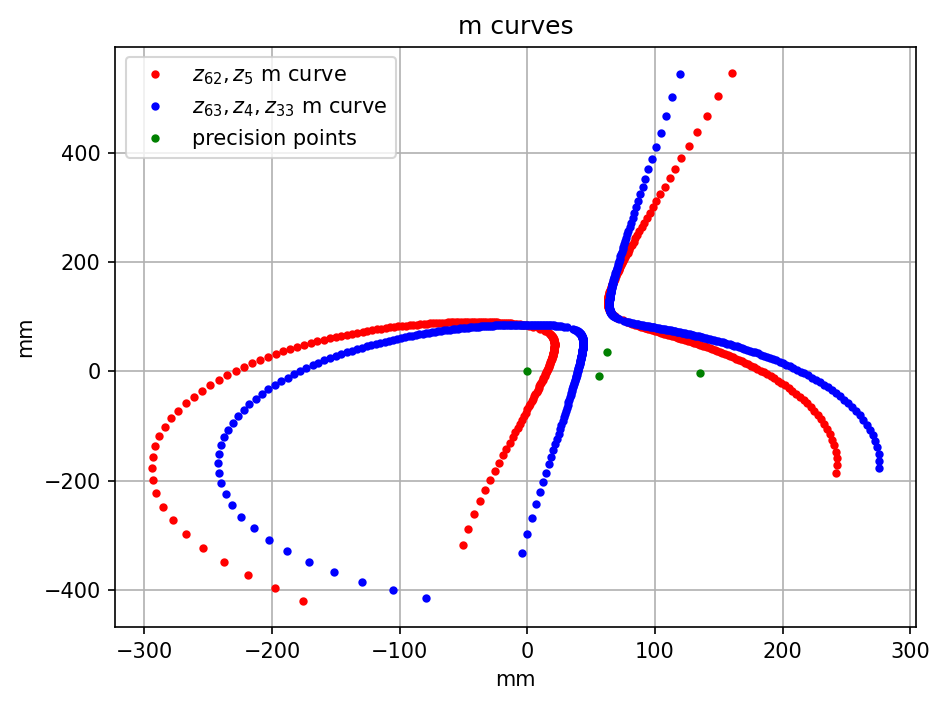

In [4]:
triad_delta = np.array([delta[0] - (pos_z33[1]-pos_z33[0]),
                        delta[1] - (pos_z33[2]-pos_z33[0]),
                        delta[2] - (pos_z33[3]-pos_z33[0])])

plt.grid("on")

m5_circ = []
m5_c = []
m4_circ = []
m4_c = []


for mode in range(2):
    for tht in range(10,350):
    
        z5i, z62i, gam5 = burmester_method(gam6, delta, (tht)*np.pi/180, mode=mode)
        m5 = ri[0]-z62i-z5i
        m5_circ.append([m5,tht, mode])
        m5_c.append(m5)
        
        
        #plt.plot(m5[0], m5[1], ".r")
        

for mode in range(2):
    for tht in range(10,350):
    
        z4i, z63i, gam4 = burmester_method(gam6, triad_delta, (tht)*np.pi/180, mode=mode)
        m4 = ri[0]-z63i-z4i-pos_z33[0]
        m4_circ.append([m4,tht, mode])
        m4_c.append(m4)
        
        #plt.plot(m4[0], m4[1], ".b")

dist = 1e17

for p5 in m5_circ:
    for p4 in m4_circ:

        cur_dist = np.linalg.norm(p5[0]-p4[0])

        if(cur_dist<0.3):
            print(tht5, p5[2], tht4, p4[2], cur_dist)

## Computation of links using feasible solutions (tht5, tht4)
z5i, z62i, gam5 = burmester_method(gam6, delta, tht5, mode=mode5)
z4i, z63i, gam4 = burmester_method(gam6, triad_delta, tht4, mode=mode4)

m5_c = np.array(m5_c)
m4_c = np.array(m4_c)

plt.title("m curves")
plt.plot(m5_c[:, 0], m5_c[:, 1], '.r', label=r"$z_{62}, z_{5}$ m curve")
plt.plot(m4_c[:, 0], m4_c[:, 1], '.b', label=r"$z_{63}, z_{4}, z_{33}$ m curve")
plt.plot(ri[:, 0], ri[:, 1], '.g', label=r"precision points")

plt.legend()
plt.xlabel("mm")
plt.ylabel("mm")
plt.savefig("../outputs/dimension_synthesis/mcurve_intersect.png")

## Check Dyad synthesis

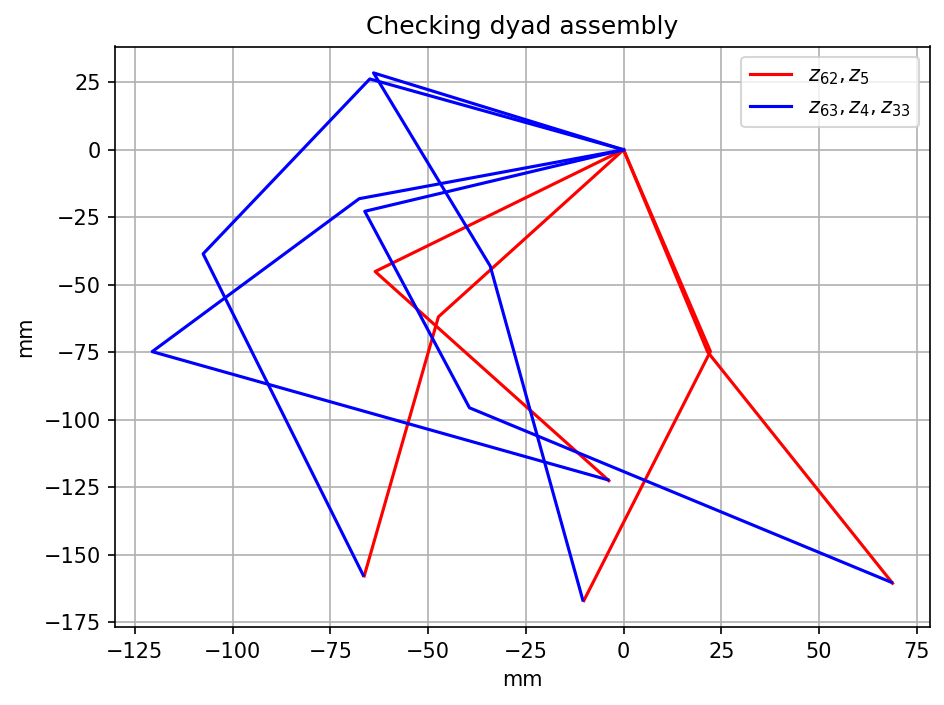

In [5]:
plt.grid("on")
for i, rii in enumerate(ri):
    z5t = z5i
    z62t = z62i

    if(i!=0):
        z5t = z5i@np.array([[np.cos(gam5[i-1]), np.sin(gam5[i-1])],
                           [-np.sin(gam5[i-1]), np.cos(gam5[i-1])]])
        
        z62t = z62i@np.array([[np.cos(gam6[i-1]), np.sin(gam6[i-1])],
                            [-np.sin(gam6[i-1]), np.cos(gam6[i-1])]])
    if i == 0:
        plt.plot([0, z5t[0], z5t[0]+z62t[0]], 
                 [0, z5t[1], z5t[1]+z62t[1]], "r", label=r"$z_{62}, z_{5}$")
    else:
        plt.plot([0, z5t[0], z5t[0]+z62t[0]], 
                 [0, z5t[1], z5t[1]+z62t[1]], "r")        


for i, rii in enumerate(ri):
    z4t = z4i
    z63t = z63i

    if(i!=0):
        z4t = z4i@np.array([[np.cos(gam4[i-1]), np.sin(gam4[i-1])],
                           [-np.sin(gam4[i-1]), np.cos(gam4[i-1])]])
        
        z63t = z63i@np.array([[np.cos(gam6[i-1]), np.sin(gam6[i-1])],
                            [-np.sin(gam6[i-1]), np.cos(gam6[i-1])]])

    if i == 0:
        plt.plot([0,pos_z33[i,0], pos_z33[i,0]+z4t[0], pos_z33[i,0]+z4t[0]+z63t[0]], 
                 [0,pos_z33[i,1], pos_z33[i,1]+z4t[1], pos_z33[i,1]+z4t[1]+z63t[1]], "b", label=r"$z_{63}, z_{4}, z_{33}$")
    else:
        plt.plot([0,pos_z33[i,0], pos_z33[i,0]+z4t[0], pos_z33[i,0]+z4t[0]+z63t[0]], 
                 [0,pos_z33[i,1], pos_z33[i,1]+z4t[1], pos_z33[i,1]+z4t[1]+z63t[1]], "b")        


plt.legend()
plt.title("Checking dyad assembly")
plt.xlabel("mm")
plt.ylabel("mm")
plt.savefig("../outputs/dimension_synthesis/dyad_assembly.png")

## Two 4 Bar synthesis for prescribed timing of the linkage (4 position)

In [6]:
# First Four bar
delta5 = []
for i in range(len(gam5)):

    z5t = z5i@np.array([[np.cos(gam5[i]), np.sin(gam5[i])],
                       [-np.sin(gam5[i]), np.cos(gam5[i])]])
    delta5.append(z5t-z5i)

delta5 = np.array(delta5)
gam1 = crank_angles[1:]-crank_angles[0]

dist = 1e17

t7_arr = np.linspace(5, 60, 350)
t2_arr = np.linspace(5, 60, 350) 

for t7 in t7_arr:

    neg_z7i, z1i, gam7 = burmester_method(gam1, delta5, t7*np.pi/180, mode=1, debug=False)
    z7i = -neg_z7i
    
    # Second Four bar
    delta1 = []
    for i in range(len(gam1)):
        z1t = z1i@np.array([[np.cos(gam1[i]), np.sin(gam1[i])],
                           [-np.sin(gam1[i]), np.cos(gam1[i])]])
        delta1.append(z1t-z1i)
    
    delta1 = np.array(delta1)
    gam3 = ang_z33[1:]-ang_z33[0]

    m7 = z5i + z7i - z1i
    
    for t2 in t2_arr:
        
        z2i, z31i, gam2 = burmester_method(gam3, delta1, t2*np.pi/180, mode=0, debug=False)
        m2 = z31i + z2i - z1i
        
        if(np.linalg.norm(m7-m2)<dist):
            dist = np.linalg.norm(m7-m2)

        if(np.linalg.norm(m7-m2)<2):
            print(t2, t7, np.linalg.norm(m7-m2))

print(dist)

## Computation of links using feasible solutions (tht7, tht2)

neg_z7i, z1i, gam7 = burmester_method(gam1, delta5, tht7, mode=mode7, debug=False)
z7i = -neg_z7i

# Second Four bar
delta1 = []
for i in range(len(gam1)):
    z1t = z1i@np.array([[np.cos(gam1[i]), np.sin(gam1[i])],
                       [-np.sin(gam1[i]), np.cos(gam1[i])]])
    delta1.append(z1t-z1i)

delta1 = np.array(delta1)
gam3 = ang_z33[1:]-ang_z33[0]

z2i, z31i, gam2 = burmester_method(gam3, delta1, tht2, mode=mode2, debug=False)

print(np.linalg.norm(z5i+z7i-z31i-z2i))

26.43266475644699 23.28080229226361 1.961863498608525
26.59025787965616 23.28080229226361 1.8018359082928554
26.74785100286533 23.28080229226361 1.6697478030177617
26.905444126074496 23.28080229226361 1.5712252685483192
27.063037249283667 23.28080229226361 1.5114013963096133
27.220630372492835 23.28080229226361 1.493519284678669
27.378223495702006 23.28080229226361 1.5177170588699
27.535816618911173 23.28080229226361 1.5808154449341876
27.69340974212034 23.28080229226361 1.6772920587475224
27.851002865329512 23.28080229226361 1.8007636886737073
28.00859598853868 23.28080229226361 1.9451755409207794
26.275071633237822 23.43839541547278 1.7974791603298983
26.43266475644699 23.43839541547278 1.5791160182618496
26.59025787965616 23.43839541547278 1.3819190147127747
26.74785100286533 23.43839541547278 1.2142546130522025
26.905444126074496 23.43839541547278 1.0877074091331016
27.063037249283667 23.43839541547278 1.0155219982288566
27.220630372492835 23.43839541547278 1.0072708630206937
27.37

## Check Entire linkage assembly

In [7]:
z2i
z31i
z32i = z33i-z31i
z33i
z4i
z5i
z61i = z62i-z63i
z7i
z0i = z5i+z7i-z1i

z1, z2, z31, z32, z33, z4, z5, z61, z62, z63, z7, z0 = [np.linalg.norm(nm) for nm in [z1i, z2i, z31i, 
                                                                                      z32i, z33i, z4i, 
                                                                                     z5i, z61i, z62i,
                                                                                     z63i, z7i, z0i]]

links=  {'b': z31,
         'c': z5,
         'd': z33,
         'e': z32,
         'f': z4,
         'g': z61,
         'h': z63,
         'i': z62,
         'j': z2,
         'k': z7,
         'n': z0,
         'm': z1}
tn = np.arctan2(z0i[1], z0i[0])
print(tn)
print(links)

0.17991304966866345
{'b': 84.0887361545927, 'c': 77.90915110877397, 'd': 70.0, 'e': 105.97850347954511, 'f': 77.53549034841403, 'g': 64.19328837360202, 'h': 125.84909456724523, 'i': 97.83881139172232, 'j': 100.11359491698461, 'k': 122.03808366722906, 'n': 77.33771995126325, 'm': 30.594483124304126}


77.33771995126325 30.594483124304126 100.11359491698461 84.0887361545927 77.90915110877397 122.03808366722906


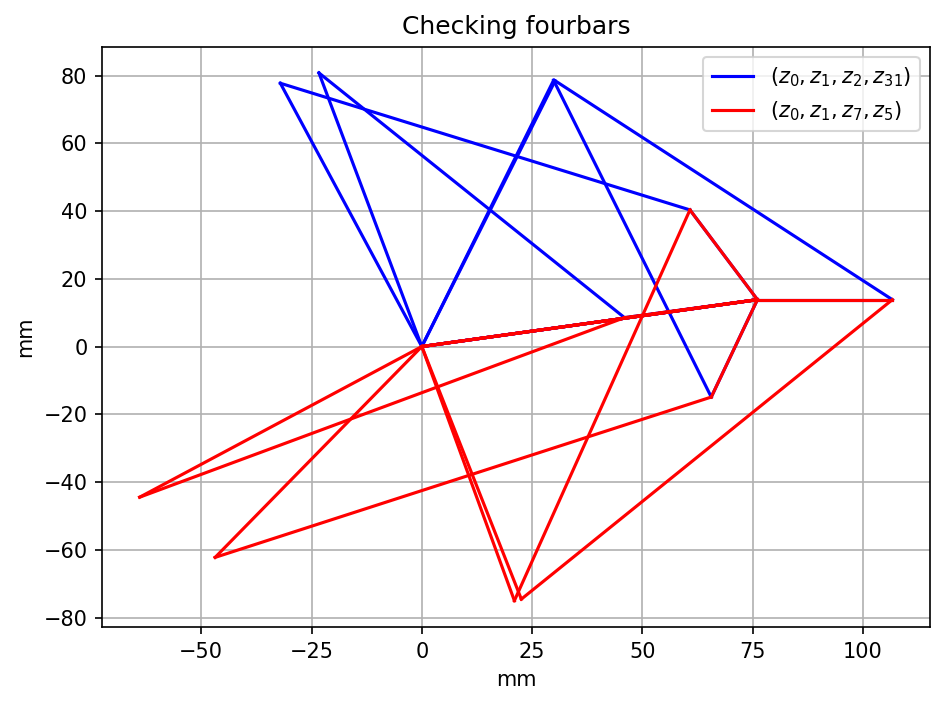

In [17]:
## checking fourbars

for i in range(4):
    tc, td = fourBar().pos_solver(z0, z1, z2, z31,
                                  tn, crank_angles[i], mode=0)
    fourBar().plot(z0, z1, z2, z31,
                   tn, crank_angles[i], tc, td)

for i, li in enumerate(plt.gca().get_lines()):
    plt.gca().get_lines()[i].set_color("blue")

for i in range(4):
    tc, td = fourBar().pos_solver(z0, z1, z7, z5,
                                  tn, crank_angles[i], mode=1)
    fourBar().plot(z0, z1, z7, z5,
                   tn, crank_angles[i], tc, td)

for i, li in enumerate(plt.gca().get_lines()):
    if i>15:
        plt.gca().get_lines()[i].set_color("red")

plt.plot([0,0.1],[0,0], 'b', label="$(z_0, z_1, z_2, z_{31})$")
plt.plot([0,0],[0,0], 'r', label="$(z_0, z_1, z_7, z_{5})$")
plt.title("Checking fourbars")
plt.legend()
plt.xlabel("mm")
plt.ylabel("mm")
plt.savefig("../outputs/dimension_synthesis/four_bar.png")
print(z0, z1, z2, z31, z5, z7)

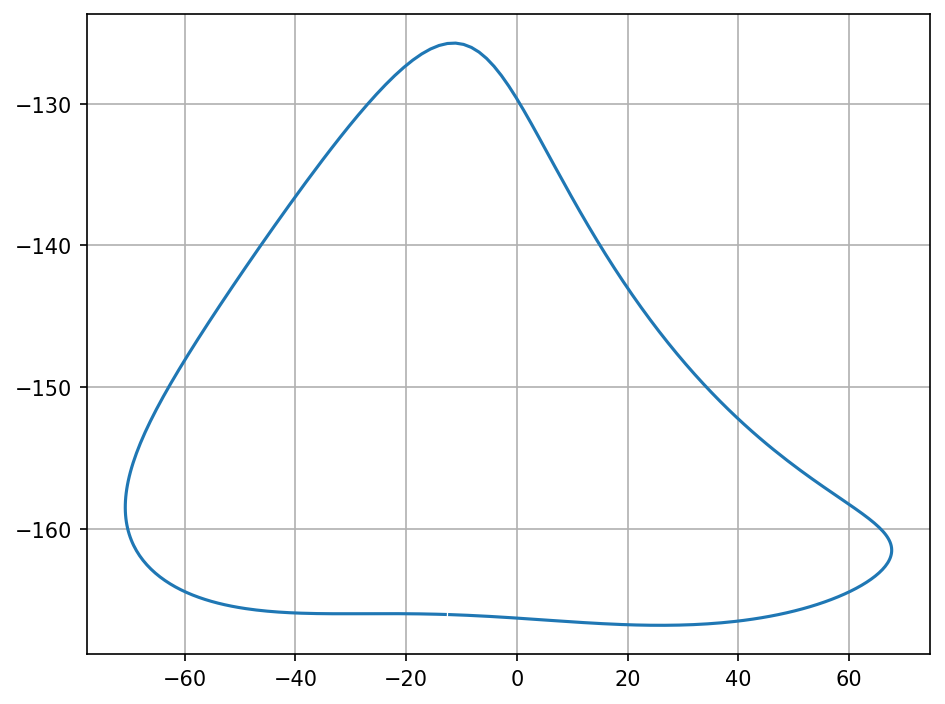

In [9]:
# coupler curve
jl = jansenLinkage(links=links, tn=tn)
p7 = []
plt.grid("on")
for i in range(360):
    pos, _, _ , _ = jl.kinematic_analysis(tm=i*np.pi/180)
    p7.append([pos["px"], pos["py"]])

p7 = np.array(p7)
plt.plot(p7[:, 0], p7[:, 1])

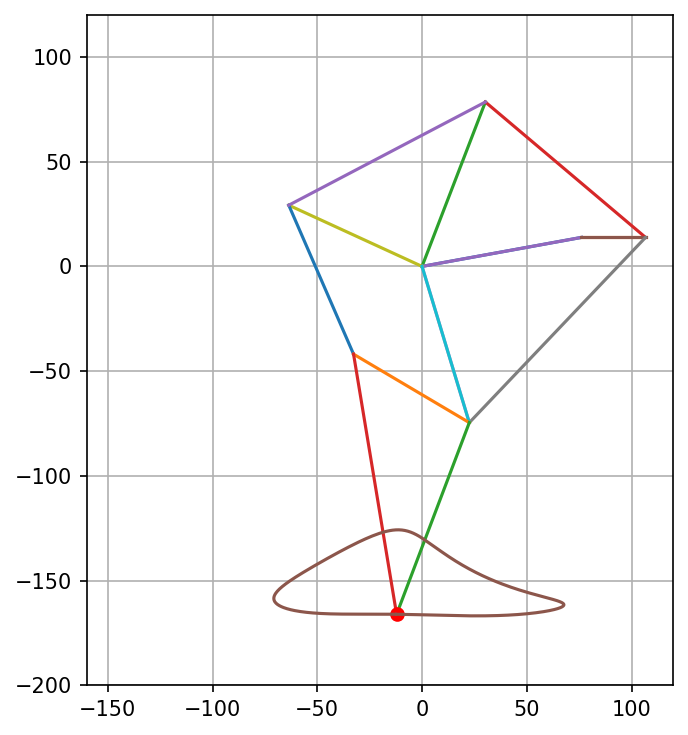

In [10]:
# Animation
jl = jansenLinkage(links=links, tn=tn)
jl.display(save = False)
jl.animation